# Exploratory Data Analysis (EDA)

### Importing Libraries

In [1]:
import pandas as pd
from ydata_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('whitegrid')
import os
import glob
import warnings
warnings.filterwarnings('ignore',category=DeprecationWarning)

### Data Ingestion

In [2]:
file_path = r"F:\ML-Projects\bank-telemarketing\data\raw\bank-additional-full.csv"

In [3]:
NA = ['unknown']
df = pd.read_csv(file_path,delimiter=';',na_values=NA)
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,NaN,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             40858 non-null  object 
 2   marital         41108 non-null  object 
 3   education       39457 non-null  object 
 4   default         32591 non-null  object 
 5   housing         40198 non-null  object 
 6   loan            40198 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

### Data Profiling

In [5]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Data Wrangling

Listing Categorical & Numerical & Binary Features

In [6]:
# mask_cat = lambda x: df[x].dtype == 'O'
# cat_cols = list(filter(mask_cat,df.columns))
# cat_cols.remove('y')
# print('Categorical Features: ',cat_cols)

In [7]:
cat_cols = df.select_dtypes(include=['object', 'category']).columns.to_list()
cat_cols.remove('y')
print('Categorical Features: ',cat_cols)

Categorical Features:  ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome']


In [8]:
# mask_num = lambda x: df[x].dtype != 'O'
# num_cols = list(filter(mask_num,df.columns))
# print('Numerical Features: ',num_cols)

In [9]:
num_cols = df.select_dtypes(include=['int64', 'float64']).columns.to_list()
print('Numerical Features: ',num_cols)

Numerical Features:  ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']


In [10]:
mask_bi = lambda x: len(df[x].value_counts().index) <= 2
bi_cols = list(filter(mask_bi,df.columns))
bi_cols.remove('y')
print('Binary Features: ',bi_cols)

Binary Features:  ['default', 'housing', 'loan', 'contact']


Dropping Duplicate Rows

In [11]:
print('No. of duplicate rows: ',df.duplicated().sum())

print('Removing duplicate rows')
df.drop_duplicates(inplace=True,ignore_index=True)
print('New dimension of the DataFrame: ',df.shape)

No. of duplicate rows:  12
Removing duplicate rows
New dimension of the DataFrame:  (41176, 21)


Handling Missing Values

In [12]:
print('No. of NaN/Null values')
df.isna().sum()

No. of NaN/Null values


age                  0
job                330
marital             80
education         1730
default           8596
housing            990
loan               990
contact              0
month                0
day_of_week          0
duration             0
campaign             0
pdays                0
previous             0
poutcome             0
emp.var.rate         0
cons.price.idx       0
cons.conf.idx        0
euribor3m            0
nr.employed          0
y                    0
dtype: int64

Imputing NaN values using MICE(Multiple Imputation by Chained Equations) Algorithm

In [13]:
from sklearn.preprocessing import OrdinalEncoder

encoder = OrdinalEncoder(handle_unknown='use_encoded_value',unknown_value=np.nan)
df_cat_enc = encoder.fit_transform(df[cat_cols])
df_cat_enc = pd.DataFrame(df_cat_enc,columns=cat_cols)
df_cat_enc

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome
0,3.0,1.0,0.0,0.0,0.0,0.0,1.0,6.0,1.0,1.0
1,7.0,1.0,3.0,NaN,0.0,0.0,1.0,6.0,1.0,1.0
2,7.0,1.0,3.0,0.0,1.0,0.0,1.0,6.0,1.0,1.0
3,0.0,1.0,1.0,0.0,0.0,0.0,1.0,6.0,1.0,1.0
4,7.0,1.0,3.0,0.0,0.0,1.0,1.0,6.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
41171,5.0,1.0,5.0,0.0,1.0,0.0,0.0,7.0,0.0,1.0
41172,1.0,1.0,5.0,0.0,0.0,0.0,0.0,7.0,0.0,1.0
41173,5.0,1.0,6.0,0.0,1.0,0.0,0.0,7.0,0.0,1.0
41174,9.0,1.0,5.0,0.0,0.0,0.0,0.0,7.0,0.0,1.0


In [14]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestClassifier

imputer = IterativeImputer(RandomForestClassifier(n_estimators=100,max_depth=5,n_jobs=-1,random_state=42),
                           max_iter=100,initial_strategy='most_frequent',imputation_order='ascending',random_state=42)
df_cat_imp = imputer.fit_transform(df_cat_enc)
df_cat_imp = pd.DataFrame(df_cat_imp,columns=cat_cols)
df_cat_imp

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome
0,3.0,1.0,0.0,0.0,0.0,0.0,1.0,6.0,1.0,1.0
1,7.0,1.0,3.0,0.0,0.0,0.0,1.0,6.0,1.0,1.0
2,7.0,1.0,3.0,0.0,1.0,0.0,1.0,6.0,1.0,1.0
3,0.0,1.0,1.0,0.0,0.0,0.0,1.0,6.0,1.0,1.0
4,7.0,1.0,3.0,0.0,0.0,1.0,1.0,6.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
41171,5.0,1.0,5.0,0.0,1.0,0.0,0.0,7.0,0.0,1.0
41172,1.0,1.0,5.0,0.0,0.0,0.0,0.0,7.0,0.0,1.0
41173,5.0,1.0,6.0,0.0,1.0,0.0,0.0,7.0,0.0,1.0
41174,9.0,1.0,5.0,0.0,0.0,0.0,0.0,7.0,0.0,1.0


In [15]:
df_cat_imp.isna().sum()

job            0
marital        0
education      0
default        0
housing        0
loan           0
contact        0
month          0
day_of_week    0
poutcome       0
dtype: int64

In [16]:
df_cat_dec = encoder.inverse_transform(df_cat_imp)
df_cat_dec = pd.DataFrame(df_cat_dec,columns=cat_cols)
df_cat_dec 

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,nonexistent
1,services,married,high.school,no,no,no,telephone,may,mon,nonexistent
2,services,married,high.school,no,yes,no,telephone,may,mon,nonexistent
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,nonexistent
4,services,married,high.school,no,no,yes,telephone,may,mon,nonexistent
...,...,...,...,...,...,...,...,...,...,...
41171,retired,married,professional.course,no,yes,no,cellular,nov,fri,nonexistent
41172,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,nonexistent
41173,retired,married,university.degree,no,yes,no,cellular,nov,fri,nonexistent
41174,technician,married,professional.course,no,no,no,cellular,nov,fri,nonexistent


In [17]:
df[cat_cols] = df_cat_dec
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [18]:
df.isna().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

Removing Outliers

In [19]:
df[num_cols].skew().sort_values(ascending=False)

campaign          4.762044
previous          3.831396
duration          3.262808
age               0.784560
cons.conf.idx     0.302876
cons.price.idx   -0.230853
euribor3m        -0.709194
emp.var.rate     -0.724061
nr.employed      -1.044317
pdays            -4.921386
dtype: float64

If the value for the 'pdays' feature is equal to 999, then it means the client was never contacted before this campaign. However, on assessing the 'previous' feature for the instances where 'pdays' = 999, it was seen that there were several clients who were contacted one or more times.

In [20]:
df[df['pdays'] == 999]['previous'].value_counts()

previous
0    35551
1     3696
2      349
3       50
4       12
5        2
6        1
Name: count, dtype: int64

In [21]:
df_anomaly = df.query('pdays == 999 & previous > 0')
df_anomaly

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
24006,38,blue-collar,single,basic.9y,no,yes,no,telephone,oct,tue,...,1,999,1,failure,-0.1,93.798,-40.4,4.968,5195.8,no
24012,40,services,married,high.school,no,yes,no,telephone,oct,tue,...,1,999,1,failure,-0.1,93.798,-40.4,4.968,5195.8,yes
24069,36,admin.,married,university.degree,no,yes,no,telephone,nov,wed,...,1,999,1,failure,-0.1,93.200,-42.0,4.663,5195.8,no
24095,36,admin.,married,high.school,no,yes,no,telephone,nov,wed,...,1,999,1,failure,-0.1,93.200,-42.0,4.286,5195.8,yes
24106,29,self-employed,married,university.degree,no,yes,no,telephone,nov,thu,...,1,999,1,failure,-0.1,93.200,-42.0,4.245,5195.8,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41154,32,admin.,married,university.degree,no,no,no,telephone,nov,wed,...,1,999,1,failure,-1.1,94.767,-50.8,1.030,4963.6,yes
41158,40,management,divorced,university.degree,no,yes,no,cellular,nov,wed,...,2,999,4,failure,-1.1,94.767,-50.8,1.030,4963.6,no
41161,62,retired,married,university.degree,no,yes,no,cellular,nov,thu,...,1,999,2,failure,-1.1,94.767,-50.8,1.031,4963.6,yes
41163,34,student,single,high.school,no,yes,no,cellular,nov,thu,...,1,999,2,failure,-1.1,94.767,-50.8,1.031,4963.6,no


Dropping the anomalous instances from the dataframe.

In [22]:
anomaly_index = df_anomaly.index
df.drop(anomaly_index,axis=0,inplace=True)
df.reset_index(inplace=True,drop=True)

In [23]:
# from scipy import stats 

# z = np.abs(stats.zscore(df['duration'],axis=0))
# outliers = z[z>=2.5].dropna(axis=0,how='all').index

In [24]:
# df.drop(index=outliers,inplace=True)
# df.reset_index(inplace=True,drop=True)

In [25]:
Q1 = df['duration'].quantile(0.25)
Q3 = df['duration'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

lower_array = np.where(df['duration'] <= lower)[0].tolist()
upper_array = np.where(df['duration'] >= upper)[0].tolist()

In [26]:
df.drop(index=lower_array,inplace=True)
df.drop(index=upper_array,inplace=True)
df.reset_index(inplace=True,drop=True)

### Descriptive Statistics

Categorical Features

In [27]:
df.describe(include='object').T

,count,unique,top,freq
job,34400,11,admin.,8913
marital,34400,3,married,21063
education,34400,7,university.degree,10932
default,34400,2,no,34398
housing,34400,2,yes,18360
loan,34400,2,no,29202
contact,34400,2,cellular,20597
month,34400,10,may,11171
day_of_week,34400,5,mon,7190
poutcome,34400,3,nonexistent,33025


Numerical Features

In [28]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,34400.0,40.065930,10.304123,17.000,32.00,38.000,47.000,98.000
duration,34400.0,204.144651,142.509534,0.000,97.00,167.000,278.000,651.000
campaign,34400.0,2.641453,2.914589,1.000,1.00,2.000,3.000,56.000
pdays,34400.0,959.307674,194.529846,0.000,999.00,999.000,999.000,999.000
previous,34400.0,0.066483,0.376609,0.000,0.00,0.000,0.000,7.000
emp.var.rate,34400.0,0.279090,1.509963,-3.400,-1.70,1.100,1.400,1.400
cons.price.idx,34400.0,93.632952,0.563011,92.201,93.20,93.918,93.994,94.767
cons.conf.idx,34400.0,-40.213750,4.441800,-50.800,-42.70,-41.800,-36.400,-26.900
euribor3m,34400.0,3.841510,1.651518,0.634,1.41,4.858,4.962,5.045
nr.employed,34400.0,5175.220544,68.803131,4963.600,5099.10,5195.800,5228.100,5228.100


### Data Visualization 

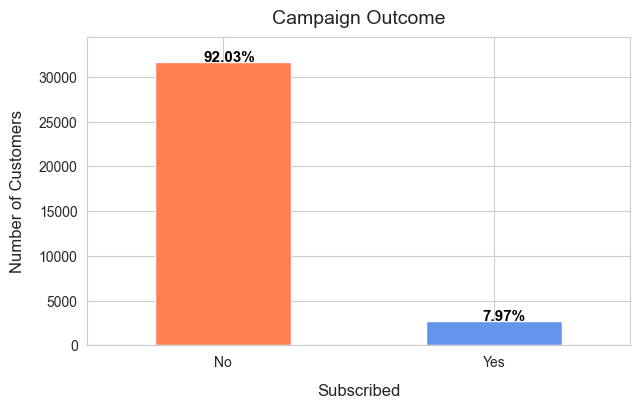

In [29]:
plt.figure(figsize=(7,4))
df['y'].value_counts().plot(kind='bar',stacked=True,color=['coral','cornflowerblue'])
plt.title('Campaign Outcome',size=14,pad=10)
plt.xlabel('Subscribed',size=12,labelpad=10)
plt.xticks([0,1],['No','Yes'],rotation=0)
plt.ylabel('Number of Customers',size=12,labelpad=10)
plt.ylim([0,len(df)])
plt.tick_params(axis='both',labelsize=10)
no_per = np.round((df['y'].value_counts()['no']*100/len(df['y'])),2)
yes_per = np.round((df['y'].value_counts()['yes']*100/len(df['y'])),2)
kwargs = {'fontweight':'bold','fontsize':11,'color':'black'}
plt.annotate(str(no_per)+'%',[-0.07,df['y'].value_counts()['no']],**kwargs)
plt.annotate(str(yes_per)+'%',[0.955,df['y'].value_counts()['yes']],**kwargs);

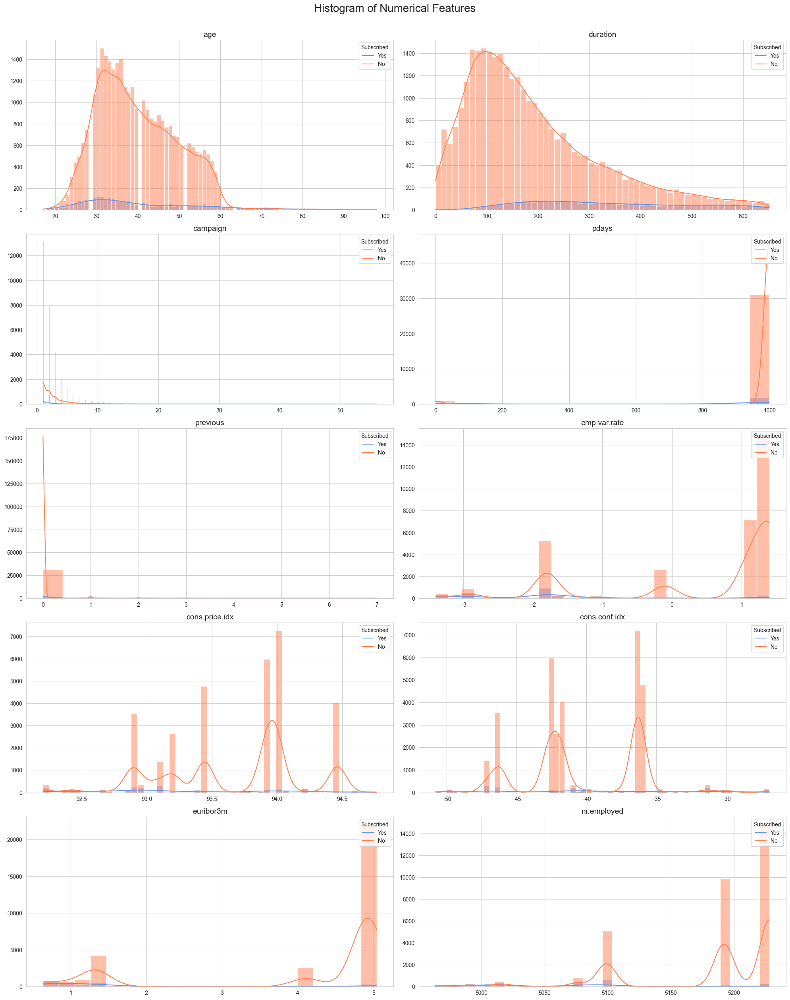

In [30]:
fig,ax = plt.subplots(5,2,figsize=(20,25))
plt.suptitle('Histogram of Numerical Features',y=1.005,fontsize=20)

for i,col in enumerate(num_cols):
    sns.histplot(data=df,x=col,hue='y',ax=ax.ravel()[i],kde=True,palette=('coral','cornflowerblue'))
    ax.ravel()[i].set_title(col,size=14)
    ax.ravel()[i].set_xlabel('')
    ax.ravel()[i].set_ylabel('')
    ax.ravel()[i].legend(title='Subscribed',loc='upper right',labels=['Yes','No'])
    
plt.tight_layout()

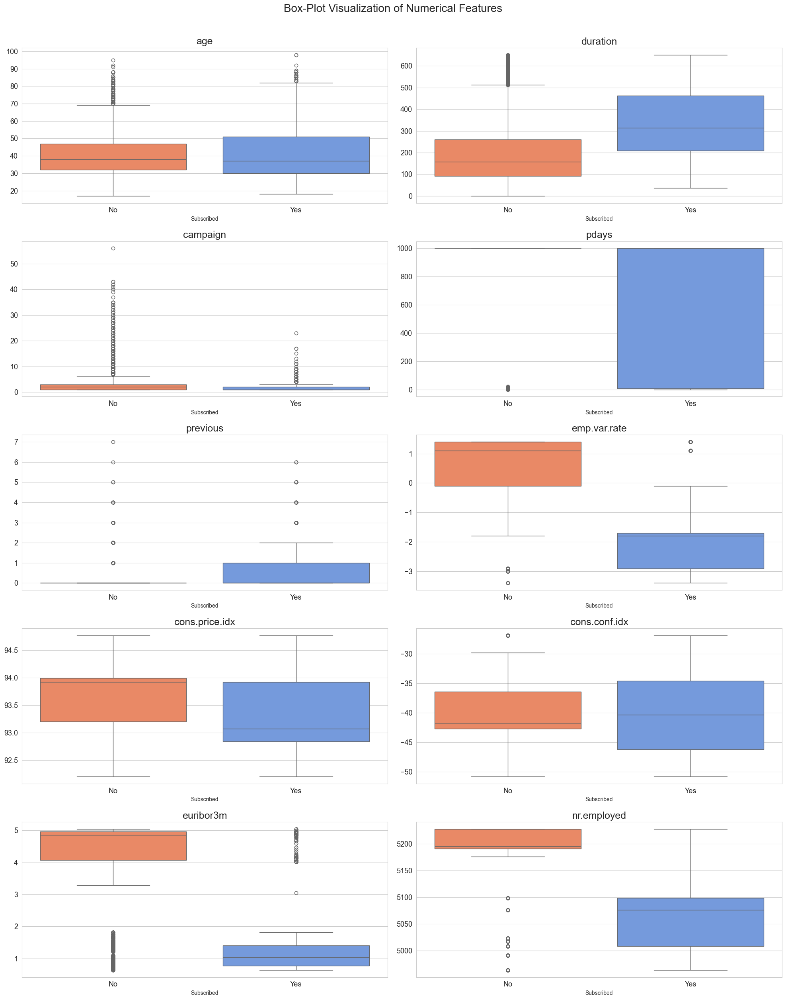

In [31]:
fig,ax = plt.subplots(5,2,figsize=(20,25))
plt.suptitle('Box-Plot Visualization of Numerical Features',y=1.005,fontsize=20)

font = {'size':15}
plt.rc('font',**font)

for i,col in enumerate(num_cols):
    sns.boxplot(data=df,x='y',y=col,hue='y',palette=('coral','cornflowerblue'),ax=ax.ravel()[i])
    ax.ravel()[i].set_title(col)
    ax.ravel()[i].set_xlabel('Subscribed')
    ax.ravel()[i].set_xticks([0,1])
    ax.ravel()[i].set_xticklabels(['No','Yes'])
    ax.ravel()[i].set_ylabel('')
    ax.ravel()[i].tick_params(axis='both',labelsize=13)
    
plt.tight_layout()

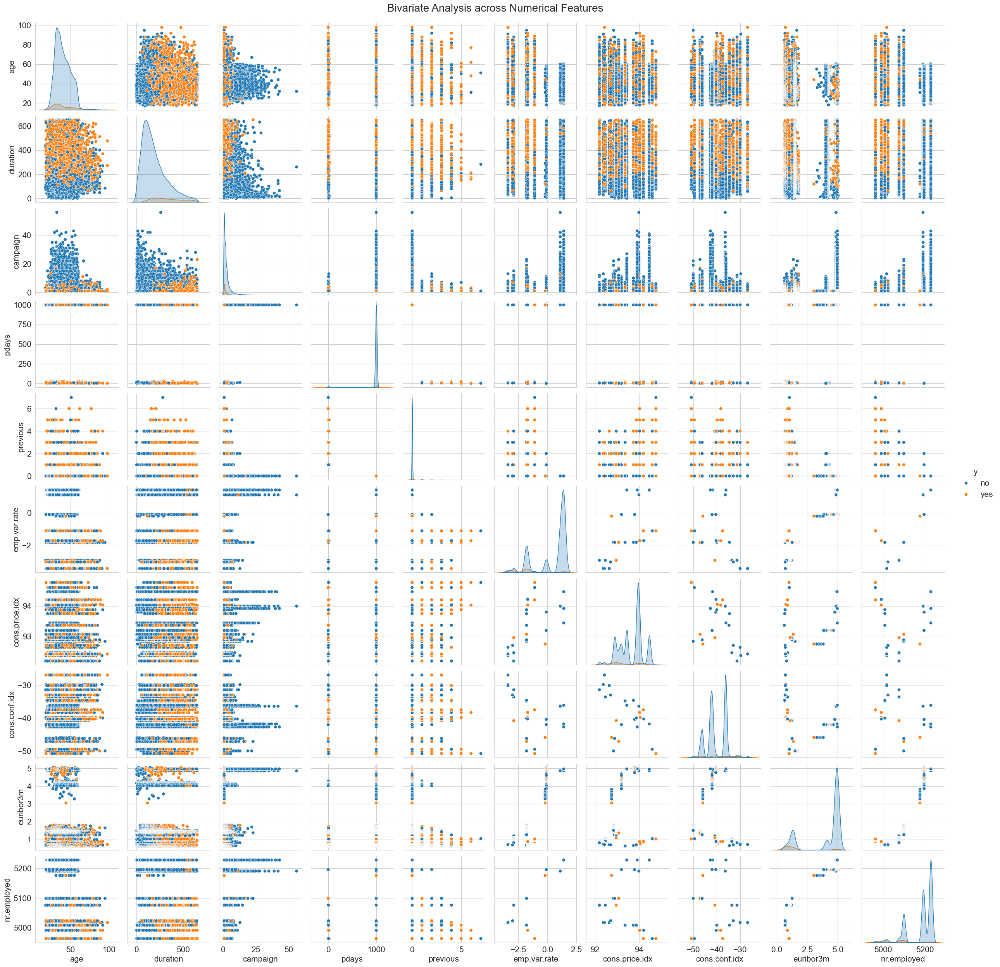

In [32]:
pp = sns.pairplot(data=df,hue='y')
pp.fig.suptitle('Bivariate Analysis across Numerical Features',y=1.005,fontsize=20);

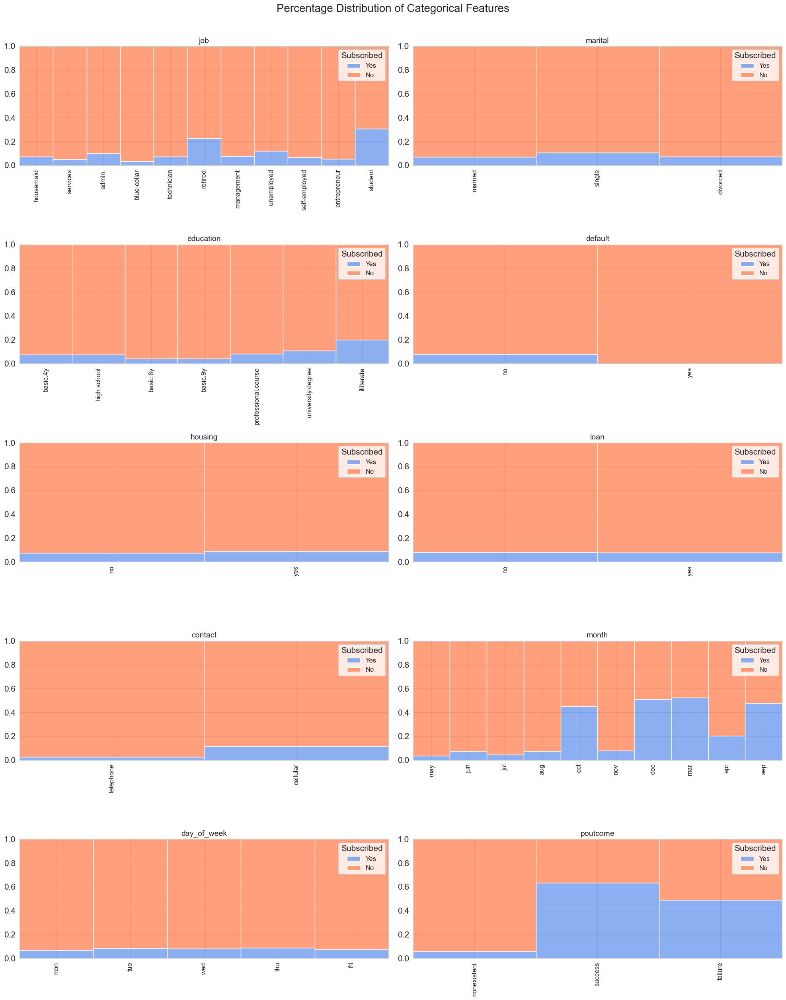

In [33]:
fig,ax = plt.subplots(5,2,figsize=(20,25))
plt.suptitle('Percentage Distribution of Categorical Features',y=1.005,fontsize=20)

for i,col in enumerate(cat_cols):
    sns.histplot(data=df,x=col,hue='y',multiple='fill',stat='percent',discrete=True,palette=('coral','cornflowerblue'),ax=ax.ravel()[i])
    ax.ravel()[i].set_title(col,size=14)
    ax.ravel()[i].set_xlabel('')
    ax.ravel()[i].tick_params(axis='x',rotation=90,labelsize=12)
    ax.ravel()[i].set_ylabel('')
    ax.ravel()[i].legend(title='Subscribed',loc='upper right',labels=['Yes','No'],fontsize=12)
    
plt.tight_layout()

### Train-Test-Split

Feature Matrix

In [34]:
X = df.drop('y',axis=1)
X.shape

(34400, 20)

Target Vector

In [35]:
y = df['y']
y.shape

(34400,)

In [36]:
from sklearn.model_selection import train_test_split

Xtrain,Xtest,ytrain,ytest = train_test_split(X,y,test_size=0.2,random_state=42,stratify=y,shuffle=True)

print('Training Set')
print(Xtrain.shape,ytrain.shape)

print('Testing Set')
print(Xtest.shape,ytest.shape)

Training Set
(27520, 20) (27520,)
Testing Set
(6880, 20) (6880,)


In [37]:
df_train = pd.concat([Xtrain,ytrain],axis=1)
df_train.reset_index(inplace=True,drop=True)
df_train

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,30,technician,married,high.school,no,no,no,telephone,jun,fri,...,6,999,0,nonexistent,1.4,94.465,-41.8,4.947,5228.1,no
1,33,technician,divorced,high.school,no,yes,no,cellular,may,fri,...,1,999,0,nonexistent,-1.8,92.893,-46.2,1.250,5099.1,no
2,35,blue-collar,single,basic.9y,no,yes,no,telephone,may,wed,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no
3,51,blue-collar,married,basic.9y,no,no,no,cellular,apr,mon,...,5,999,0,nonexistent,-1.8,93.075,-47.1,1.405,5099.1,no
4,32,management,single,university.degree,no,yes,yes,cellular,mar,tue,...,1,999,0,nonexistent,-1.8,92.843,-50.0,1.687,5099.1,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27515,30,admin.,single,high.school,no,no,no,cellular,sep,fri,...,3,6,1,success,-1.1,94.199,-37.5,0.883,4963.6,yes
27516,48,technician,married,professional.course,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
27517,40,services,married,high.school,no,yes,no,telephone,may,mon,...,3,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
27518,34,blue-collar,single,basic.9y,no,no,no,telephone,may,wed,...,3,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no


In [38]:
df_test = pd.concat([Xtest,ytest],axis=1)
df_test.reset_index(inplace=True,drop=True)
df_test

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,59,blue-collar,married,basic.4y,no,yes,no,cellular,aug,tue,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.963,5228.1,no
1,25,admin.,single,high.school,no,no,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no
2,35,blue-collar,single,basic.9y,no,yes,no,cellular,jul,mon,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
3,38,admin.,single,university.degree,no,yes,no,telephone,may,mon,...,2,999,0,nonexistent,1.1,93.994,-36.4,4.858,5191.0,no
4,45,admin.,single,professional.course,no,yes,no,telephone,may,wed,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.858,5191.0,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6875,37,blue-collar,married,basic.6y,no,yes,no,cellular,jul,wed,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no
6876,31,blue-collar,single,high.school,no,yes,no,cellular,nov,wed,...,1,6,1,success,-0.1,93.200,-42.0,4.120,5195.8,yes
6877,38,unemployed,divorced,university.degree,no,yes,no,telephone,may,wed,...,3,999,0,nonexistent,1.1,93.994,-36.4,4.858,5191.0,no
6878,46,admin.,divorced,university.degree,no,no,no,telephone,may,wed,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no


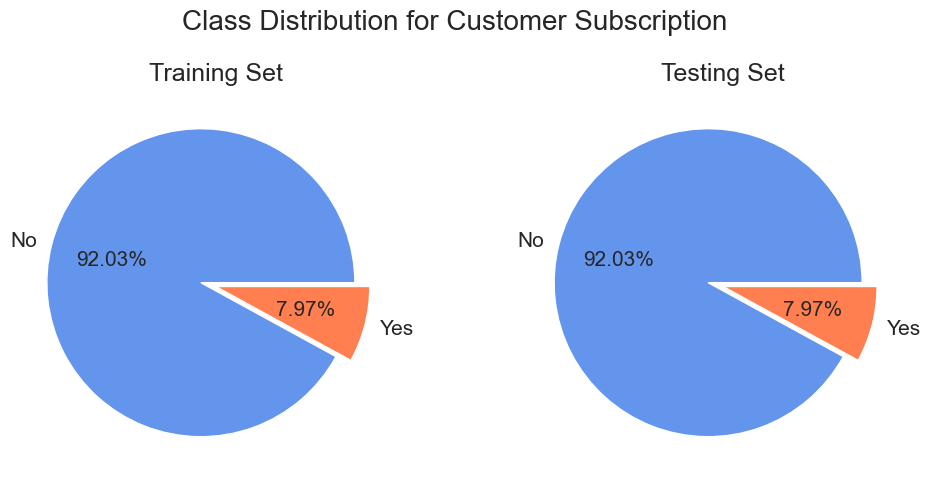

In [39]:
fig,ax = plt.subplots(1,2,figsize=(12,5))
fig.suptitle('Class Distribution for Customer Subscription',y=1.05,fontsize=20)

labels = ['No','Yes']
colors = ['cornflowerblue','coral'] 
explode = [0.1,0]

ax[0].pie(df_train['y'].value_counts(),labels=labels,colors=colors,explode=explode,autopct='%.2f%%')
ax[0].set_title('Training Set',pad=10)

ax[1].pie(df_test['y'].value_counts(),labels=labels,colors=colors,explode=explode,autopct='%.2f%%')
ax[1].set_title('Testing Set',pad=10);

### Synthetic Minority Oversampling Technique (SMOTE)

In [40]:
from imblearn.over_sampling import SMOTE,SMOTEN

In [41]:
smote = SMOTEN(random_state=42)
X_res,y_res = smote.fit_resample(X,y)

In [42]:
print('Data Set after Over Sampling with SMOTE')
print(f'Feature Matrix: {X_res.shape}')
print(f'Target Vector: {y_res.shape}')

Data Set after Over Sampling with SMOTE
Feature Matrix: (63318, 20)
Target Vector: (63318,)


In [43]:
from sklearn.model_selection import train_test_split

Xtrain_res,Xtest_res,ytrain_res,ytest_res = train_test_split(X_res,y_res,test_size=0.2,random_state=42,stratify=y_res,shuffle=True)

print('Oversampled Training Set')
print(Xtrain_res.shape,ytrain_res.shape)

print('Oversampled Testing Set')
print(Xtest_res.shape,ytest_res.shape)

Oversampled Training Set
(50654, 20) (50654,)
Oversampled Testing Set
(12664, 20) (12664,)


In [44]:
df_train_res = pd.concat([Xtrain_res,ytrain_res],axis=1)
df_train_res.reset_index(inplace=True,drop=True)
df_train_res

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,50,management,married,university.degree,no,no,no,cellular,aug,mon,...,2,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
1,32,technician,divorced,professional.course,no,yes,yes,cellular,mar,tue,...,1,999,0,nonexistent,-1.8,92.843,-50.0,1.556,5099.1,yes
2,43,blue-collar,married,basic.4y,no,yes,no,telephone,jun,wed,...,2,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,no
3,59,admin.,divorced,professional.course,no,no,no,telephone,aug,tue,...,1,999,0,nonexistent,-2.9,92.201,-31.4,0.883,5076.2,no
4,34,blue-collar,married,basic.4y,no,no,no,cellular,jul,wed,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50649,33,admin.,single,university.degree,no,no,no,cellular,aug,wed,...,1,999,0,nonexistent,-2.9,92.201,-31.4,0.879,5076.2,no
50650,50,blue-collar,divorced,basic.9y,no,no,no,cellular,may,fri,...,3,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no
50651,74,retired,married,basic.4y,no,yes,no,cellular,aug,mon,...,1,6,1,success,-2.9,92.201,-31.4,0.861,5076.2,yes
50652,71,retired,single,university.degree,no,yes,no,cellular,oct,tue,...,1,999,0,nonexistent,-3.4,92.431,-26.9,0.742,5017.5,no


In [45]:
df_test_res = pd.concat([Xtest_res,ytest_res],axis=1)
df_test_res.reset_index(inplace=True,drop=True)
df_test_res

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,32,blue-collar,married,basic.6y,no,yes,no,telephone,jul,wed,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no
1,22,retired,married,basic.4y,no,yes,no,cellular,sep,wed,...,1,3,2,success,-1.1,92.379,-49.5,0.985,4963.6,yes
2,21,admin.,single,high.school,no,no,yes,cellular,may,thu,...,1,999,0,nonexistent,-1.8,92.893,-46.2,1.266,5099.1,no
3,35,admin.,single,basic.6y,no,yes,no,cellular,nov,tue,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.040,4963.6,yes
4,30,admin.,married,university.degree,no,yes,no,cellular,aug,mon,...,3,999,0,nonexistent,1.4,93.444,-36.1,4.968,5228.1,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12659,34,management,married,university.degree,no,no,no,cellular,aug,thu,...,1,999,0,nonexistent,-0.1,93.200,-42.0,4.021,5195.8,yes
12660,49,management,married,university.degree,no,no,yes,cellular,jul,tue,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
12661,71,admin.,married,basic.4y,no,yes,no,cellular,may,mon,...,2,6,2,success,-1.8,93.876,-40.0,0.642,5008.7,yes
12662,26,unemployed,single,university.degree,no,yes,no,cellular,apr,tue,...,1,999,0,nonexistent,-1.8,93.075,-47.1,1.423,5099.1,yes


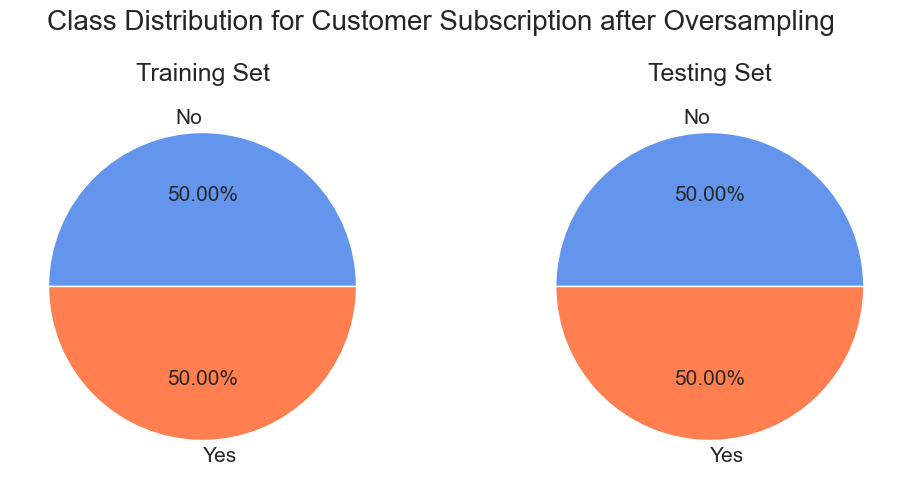

In [46]:
fig,ax = plt.subplots(1,2,figsize=(12,5))
fig.suptitle('Class Distribution for Customer Subscription after Oversampling',y=1.05,fontsize=20)

labels = ['No','Yes']
colors = ['cornflowerblue','coral'] 

ax[0].pie(df_train_res['y'].value_counts(),labels=labels,colors=colors,autopct='%.2f%%')
ax[0].set_title('Training Set',pad=10)

ax[1].pie(df_test_res['y'].value_counts(),labels=labels,colors=colors,autopct='%.2f%%')
ax[1].set_title('Testing Set',pad=10);

### Saving the Training & Testing Sets

Original Set

In [51]:
df_train.to_csv(r"F:\ML-Projects\bank-telemarketing\data\processed\bank_train.csv",index=False)
df_test.to_csv(r"F:\ML-Projects\bank-telemarketing\data\processed\bank_test.csv",index=False)

Oversampled Set

In [52]:
df_train_res.to_csv(r"F:\ML-Projects\bank-telemarketing\data\processed\bank_train_res.csv",index=False)
df_test_res.to_csv(r"F:\ML-Projects\bank-telemarketing\data\processed\bank_test_res.csv",index=False)